# Import

In [1]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from PIL import Image
import math

# Config

In [2]:
CLS5 = '/project/lt200264-saiwat/WormProject/data/classify-v1/cls_5classes'
CLS2 = '/project/lt200264-saiwat/WormProject/data/classify-v1/cls_2classes'
CLS2_PAD0_BLACKOUT = '/project/lt200264-saiwat/WormProject/data/release/worm-24022026-v1/views/cls2_pad0_blackout'
CLS2_PAD30_DIM0P3 = '/project/lt200264-saiwat/WormProject/data/release/worm-24022026-v1/views/cls2_pad30_dim0p3'
CLS2_PAD30_RAW = '/project/lt200264-saiwat/WormProject/data/release/worm-24022026-v1/views/cls2_pad30_raw'
CLS3_STAGE_PAD30 = '/project/lt200264-saiwat/WormProject/data/release/worm-24022026-v1/views/cls3_stage_pad30'
CLS4_PAD30 = '/project/lt200264-saiwat/WormProject/data/release/worm-24022026-v1/views/cls4_pad30'
CLS5_PAD30 = '/project/lt200264-saiwat/WormProject/data/release/worm-24022026-v1/views/cls5_pad30'

# Helper function

In [3]:
def plot_class_dist(dataset_dir):
    ds_path = Path(dataset_dir)
    splits = ['train', 'val', 'test']
    
    train_path = ds_path / 'train'
    if not train_path.exists():
        print(f"Train directory not found at {train_path}")
        return
        
    classes = sorted([d.name for d in train_path.iterdir() if d.is_dir()]) # get class folder name

    split_counts = {split: [] for split in splits}
    for split in splits:
        for cls in classes:
            cls_dir = ds_path / split / cls
            if cls_dir.exists():
                count = sum(1 for x in cls_dir.iterdir() if x.is_file()) # loop through each class folder
                split_counts[split].append(count)
            else:
                split_counts[split].append(0)
                
    x = np.arange(len(classes))
    width = 0.25
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for i, split in enumerate(splits):
        offset = width * (i - 1)
        bars = ax.bar(x + offset, split_counts[split], width, label=split)
        ax.bar_label(bars, padding=3, fmt='%d')
        
    ax.set_xlabel('Classes')
    ax.set_ylabel('Number of Images')
    ax.set_title(f'Class Distribution in {ds_path.name}')
    ax.set_xticks(x)
    ax.set_xticklabels(classes, rotation=45, ha='right')
    ax.legend()
    
    plt.tight_layout()
    plt.show()

In [4]:
def print_dataset_count(dataset_dir):
    ds_path = Path(dataset_dir)
    total_imgs = 0
    for split in ['train', 'val', 'test']:
        split_path = ds_path / split
        if split_path.exists():
            count = sum(1 for x in split_path.rglob('*') if x.is_file()) # find every thing inside path +1 if match
            print(f"{split.capitalize():<6}: {count} images")
            total_imgs += count
        else:
            print(f"{split.capitalize():<6}: 0 images (Folder not found)")
            
    print("-" * 25)
    print(f"Total : {total_imgs} images\n")

In [5]:
def view_image_folder(dataset_dir, max_images=15):
    ds_path = Path(dataset_dir)
    
    # Collect image files (adjust extensions as needed for your dataset)
    valid_exts = {'.png', '.jpg', '.jpeg', '.bmp'}
    image_paths = [p for p in ds_path.rglob('*') if p.is_file() and p.suffix.lower() in valid_exts]
    
    # Limit images to prevent crashing the notebook with massive folders
    image_paths = image_paths[:max_images]
    num_images = len(image_paths)
    
    if num_images == 0:
        print(f"No images found in {dataset_dir}")
        return
        
    cols = 3
    rows = math.ceil(num_images / cols)
    
    # Create an n*3 grid
    fig, axes = plt.subplots(rows, cols, figsize=(15, 4 * rows))
    
    # Ensure axes is iterable even if there's only 1 row/col
    if isinstance(axes, np.ndarray):
        axes = axes.flatten()
    else:
        axes = [axes]
        
    for i, img_path in enumerate(image_paths):
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].set_title(img_path.name)
        axes[i].axis('off')
        
    # Hide any remaining empty subplots if num_images isn't a multiple of 3
    for j in range(num_images, len(axes)):
        axes[j].axis('off')
        
    plt.tight_layout()
    plt.show()

# 2 class

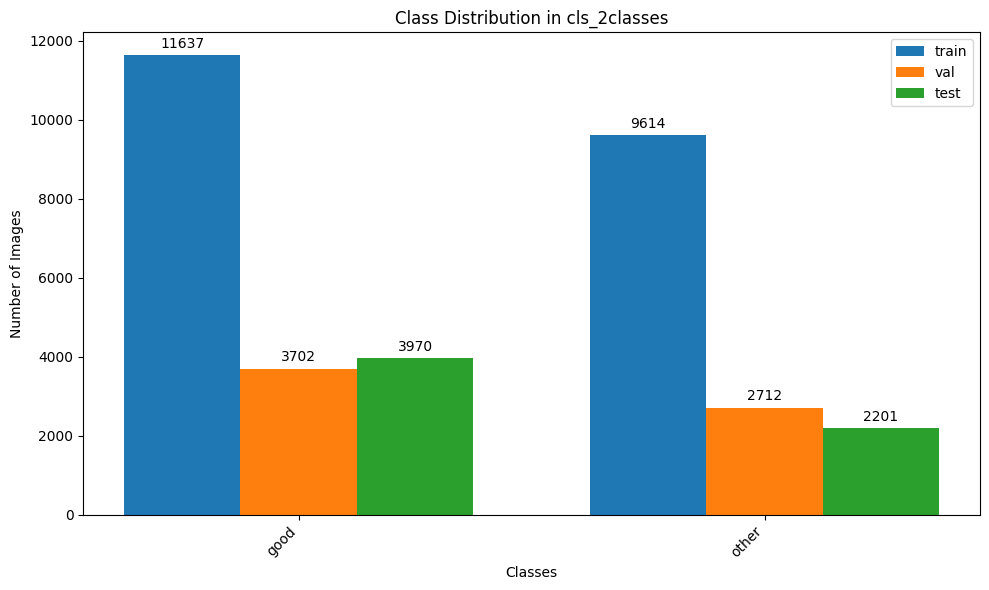

Train : 21251 images
Val   : 6414 images
Test  : 6171 images
-------------------------
Total : 33836 images



In [6]:
plot_class_dist(CLS2)
print_dataset_count(CLS2)

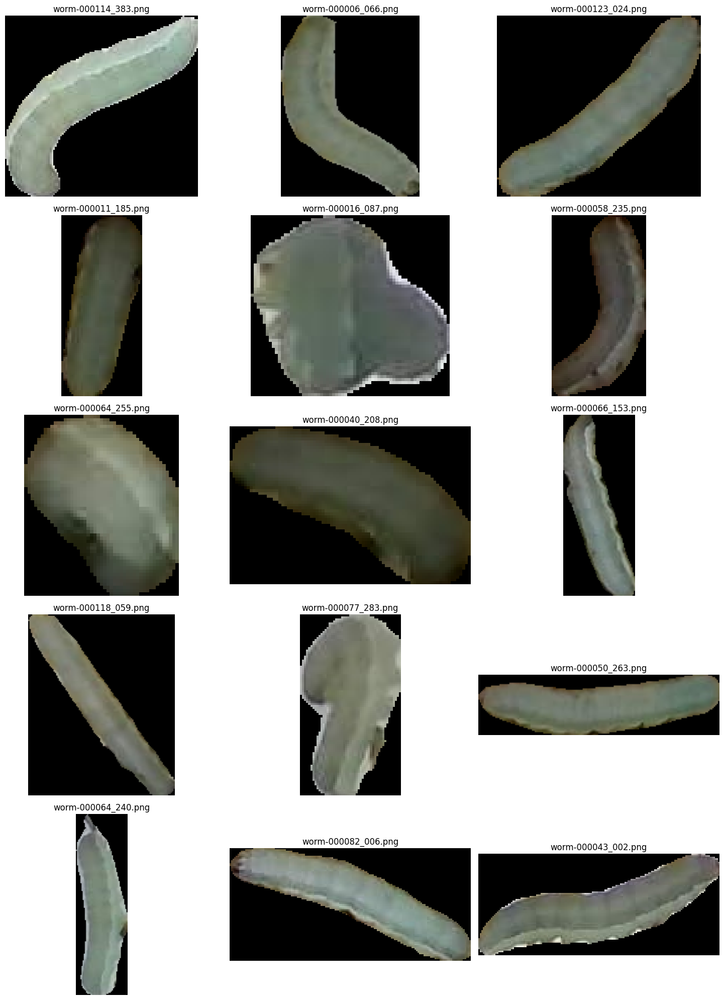

In [7]:
view_image_folder(CLS2)

# 5 Class

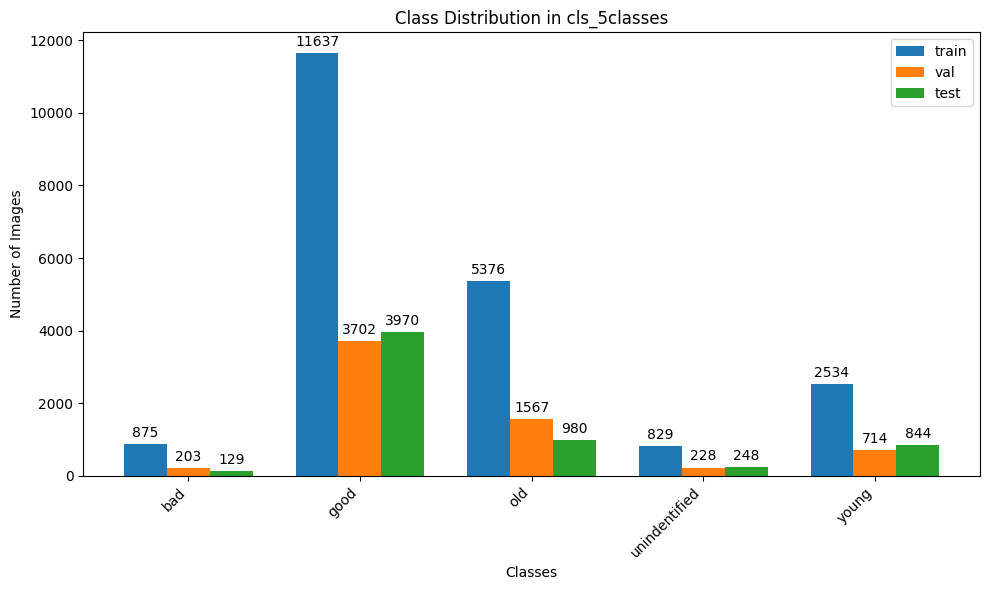

Train : 21251 images
Val   : 6414 images
Test  : 6171 images
-------------------------
Total : 33836 images



In [8]:
plot_class_dist(CLS5)
print_dataset_count(CLS5)

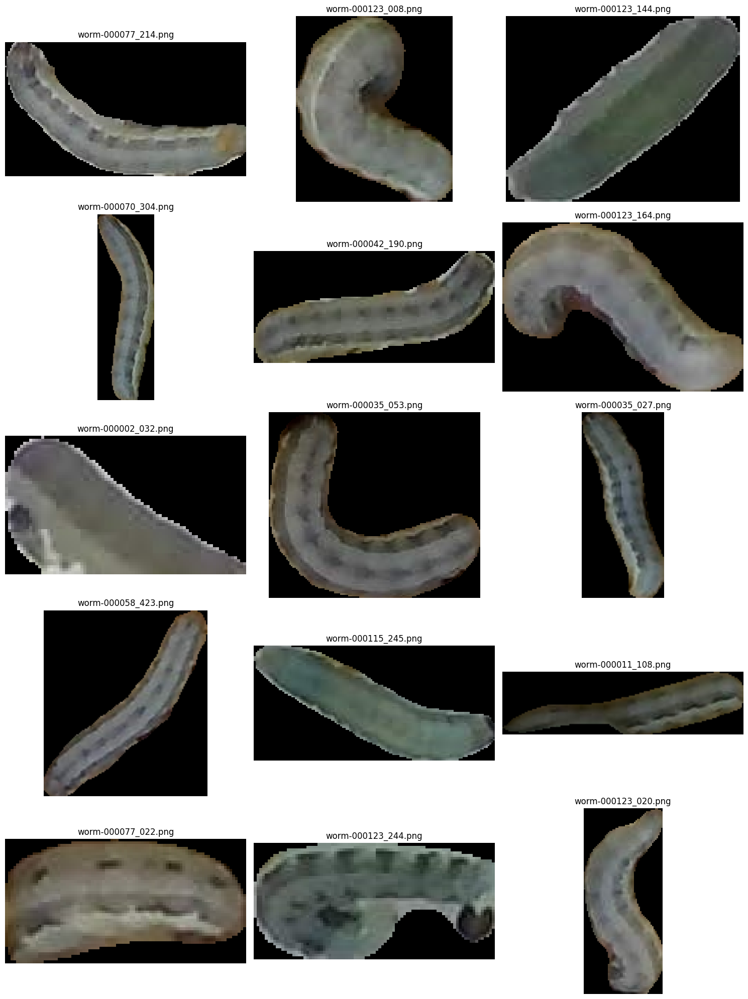

In [9]:
view_image_folder(CLS5)

# 2 class pad 0 blackout

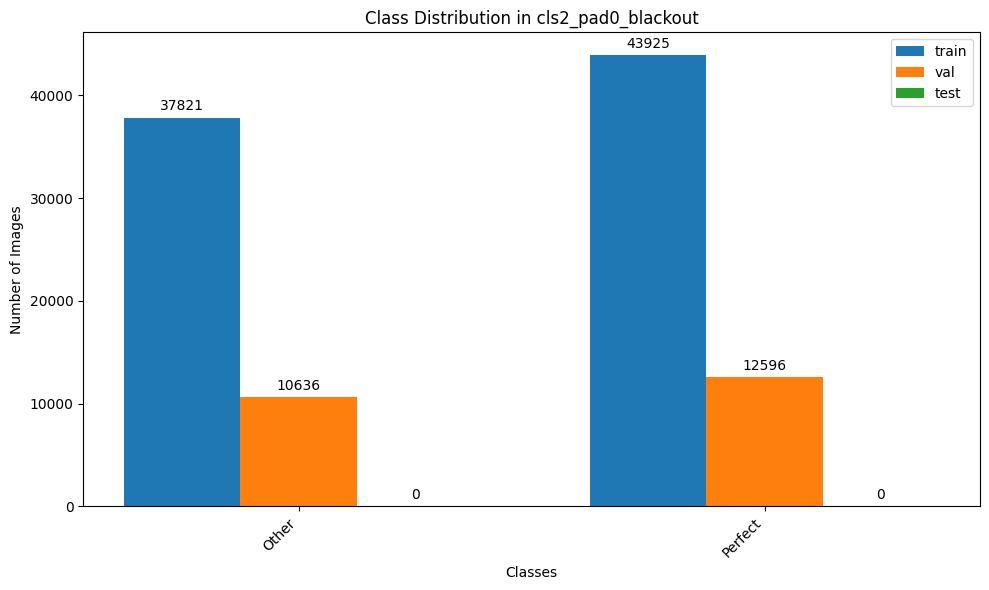

Train : 81746 images
Val   : 23232 images
Test  : 0 images (Folder not found)
-------------------------
Total : 104978 images



In [10]:
plot_class_dist(CLS2_PAD0_BLACKOUT)
print_dataset_count(CLS2_PAD0_BLACKOUT)

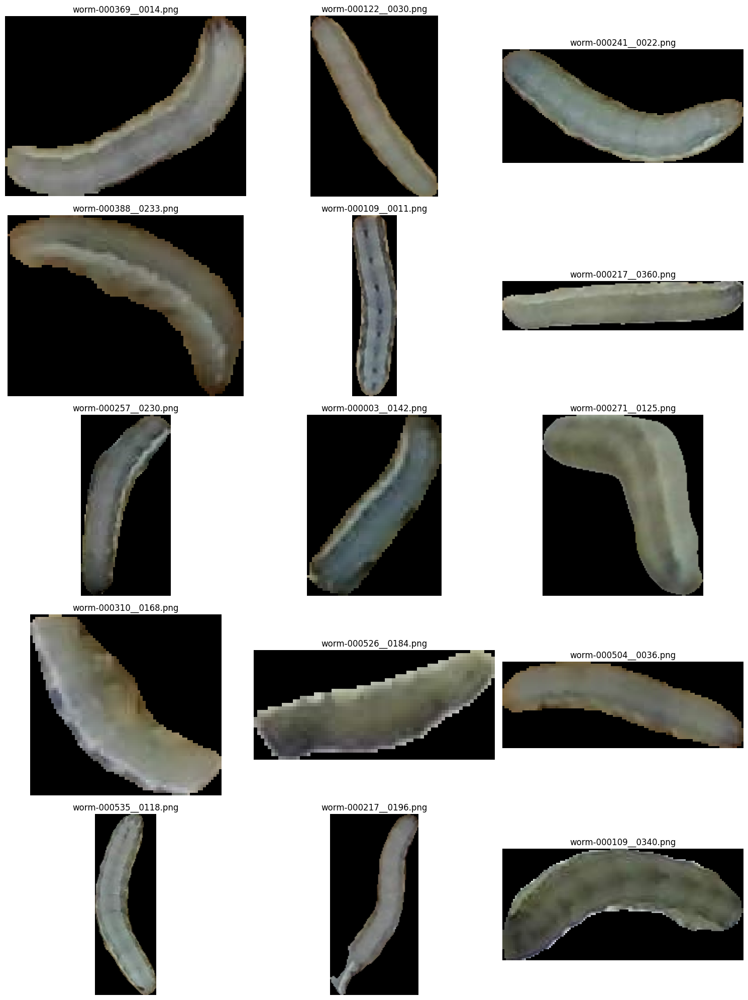

In [11]:
view_image_folder(CLS2_PAD0_BLACKOUT)

# 2 class pad 30 dim 30%

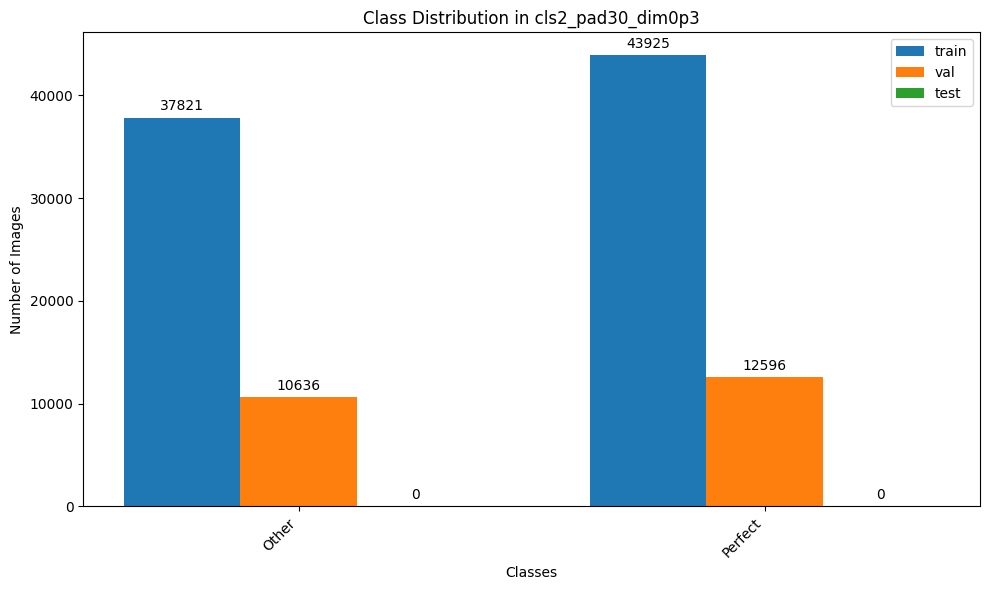

Train : 81746 images
Val   : 23232 images
Test  : 0 images (Folder not found)
-------------------------
Total : 104978 images



In [12]:
plot_class_dist(CLS2_PAD30_DIM0P3)
print_dataset_count(CLS2_PAD30_DIM0P3)

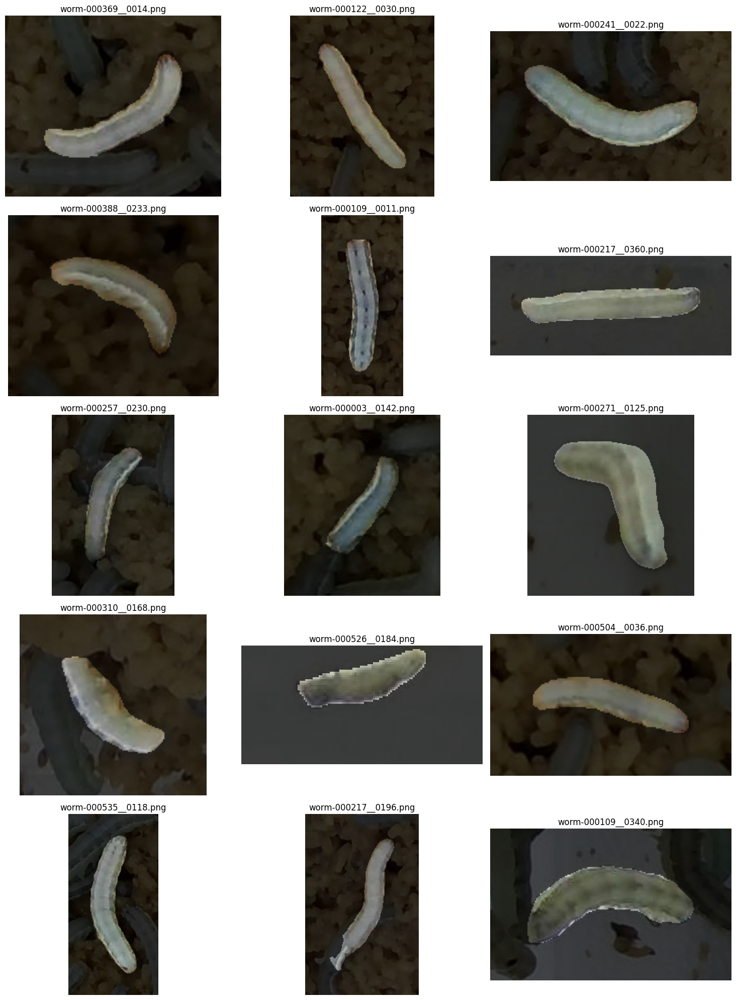

In [13]:
view_image_folder(CLS2_PAD30_DIM0P3)

# 2 class pad 30 raw

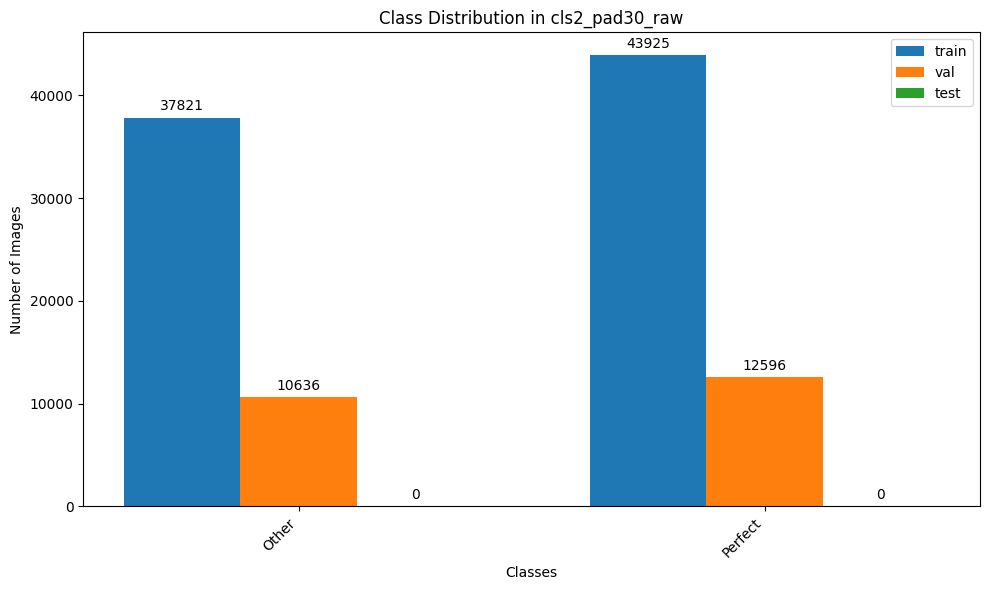

Train : 81746 images
Val   : 23232 images
Test  : 0 images (Folder not found)
-------------------------
Total : 104978 images



In [14]:
plot_class_dist(CLS2_PAD30_RAW)
print_dataset_count(CLS2_PAD30_RAW)

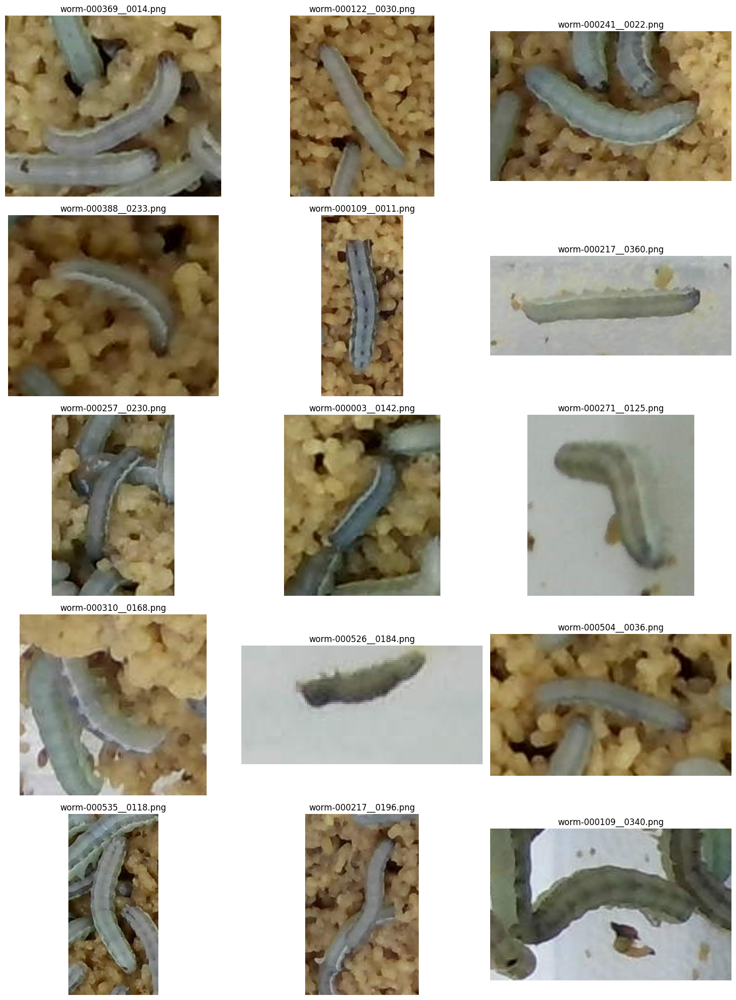

In [15]:
view_image_folder(CLS2_PAD30_RAW)

# 3 class stage pad 30

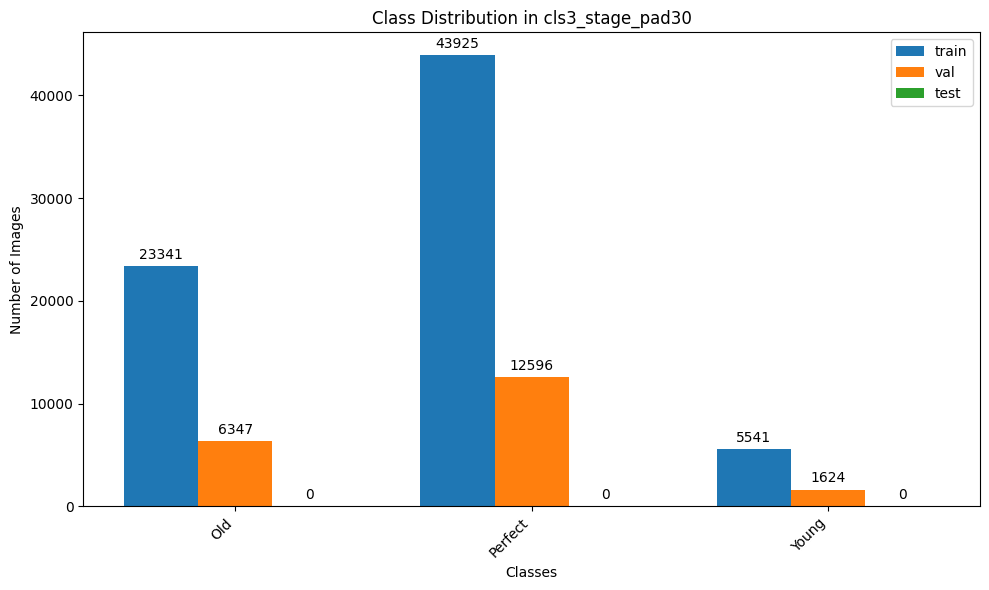

Train : 72807 images
Val   : 20567 images
Test  : 0 images (Folder not found)
-------------------------
Total : 93374 images



In [16]:
plot_class_dist(CLS3_STAGE_PAD30)
print_dataset_count(CLS3_STAGE_PAD30)

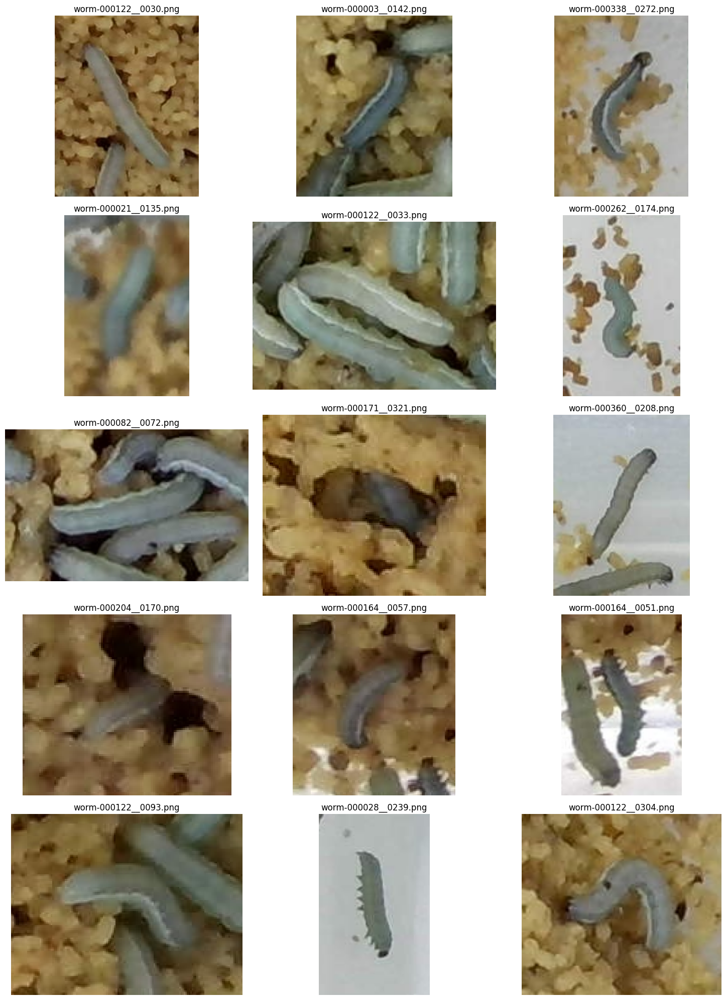

In [17]:
view_image_folder(CLS3_STAGE_PAD30)

# 4 class pad 30

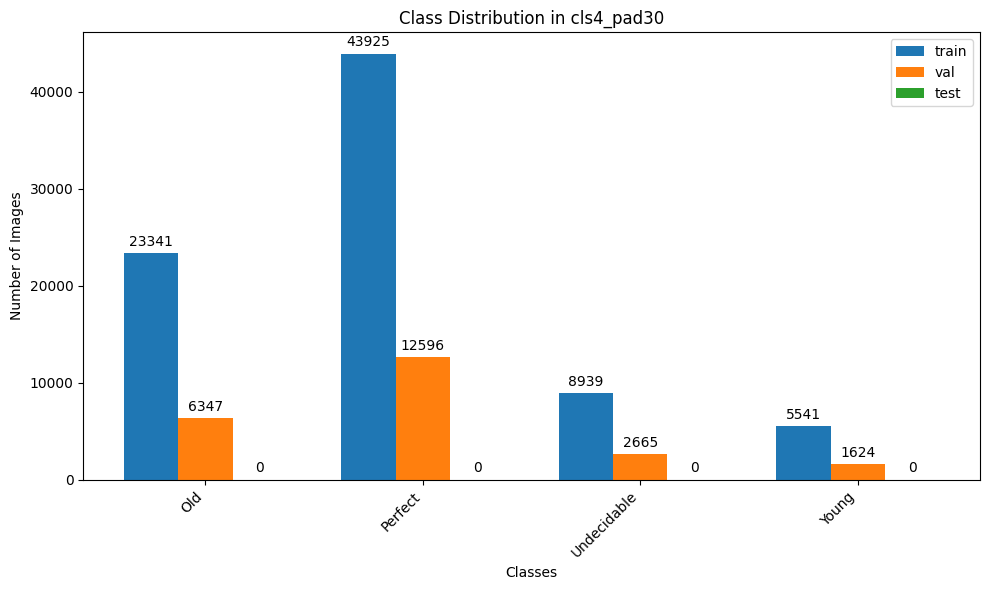

Train : 81746 images
Val   : 23232 images
Test  : 0 images (Folder not found)
-------------------------
Total : 104978 images



In [18]:
plot_class_dist(CLS4_PAD30)
print_dataset_count(CLS4_PAD30)

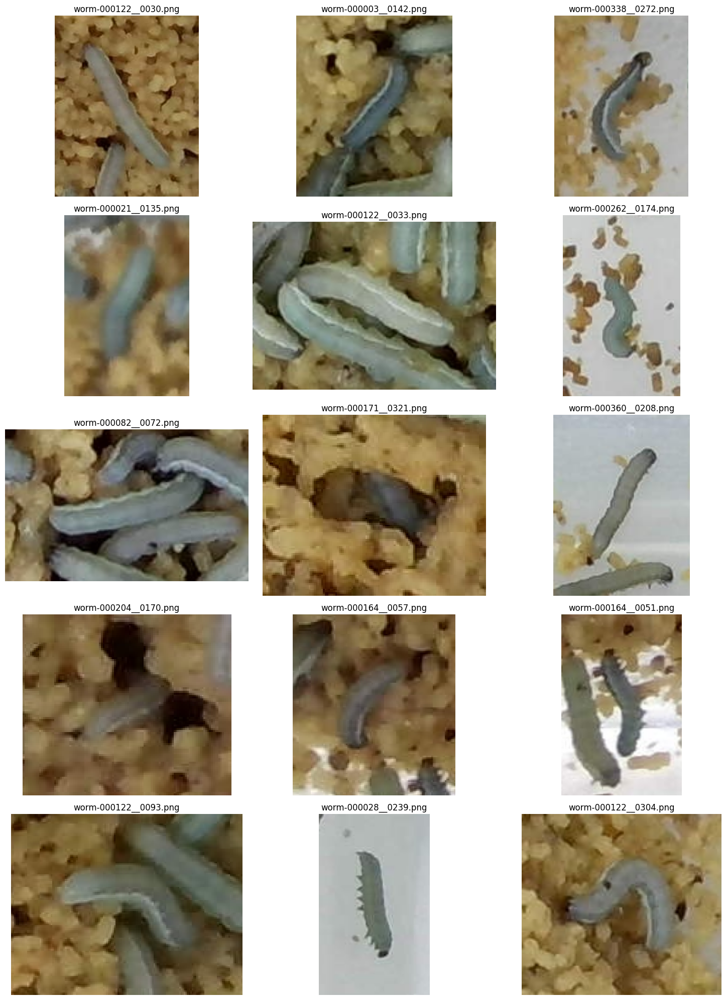

In [19]:
view_image_folder(CLS4_PAD30)

# 5 class pad 30

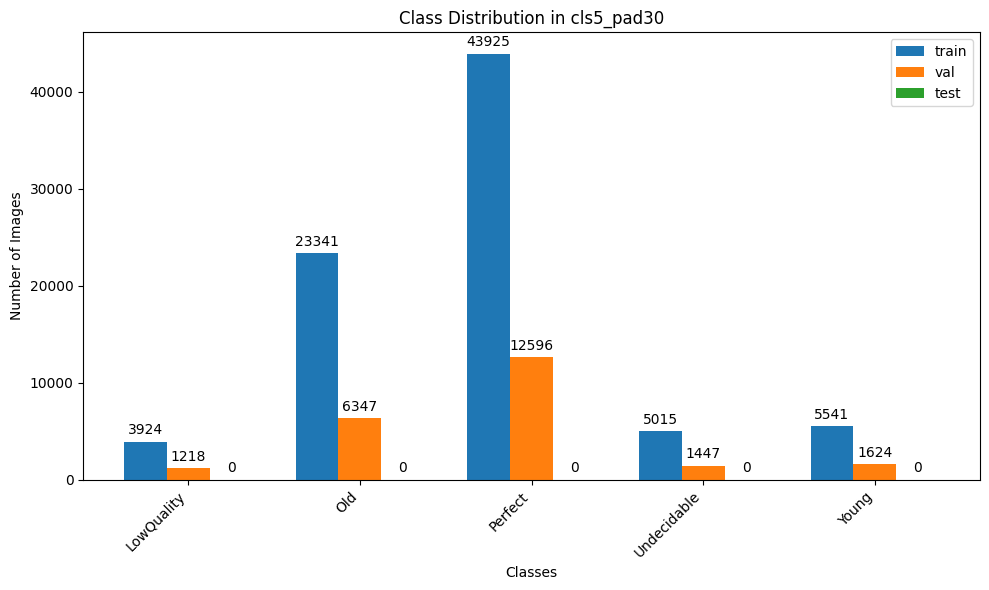

Train : 81746 images
Val   : 23232 images
Test  : 0 images (Folder not found)
-------------------------
Total : 104978 images



In [20]:
plot_class_dist(CLS5_PAD30)
print_dataset_count(CLS5_PAD30)

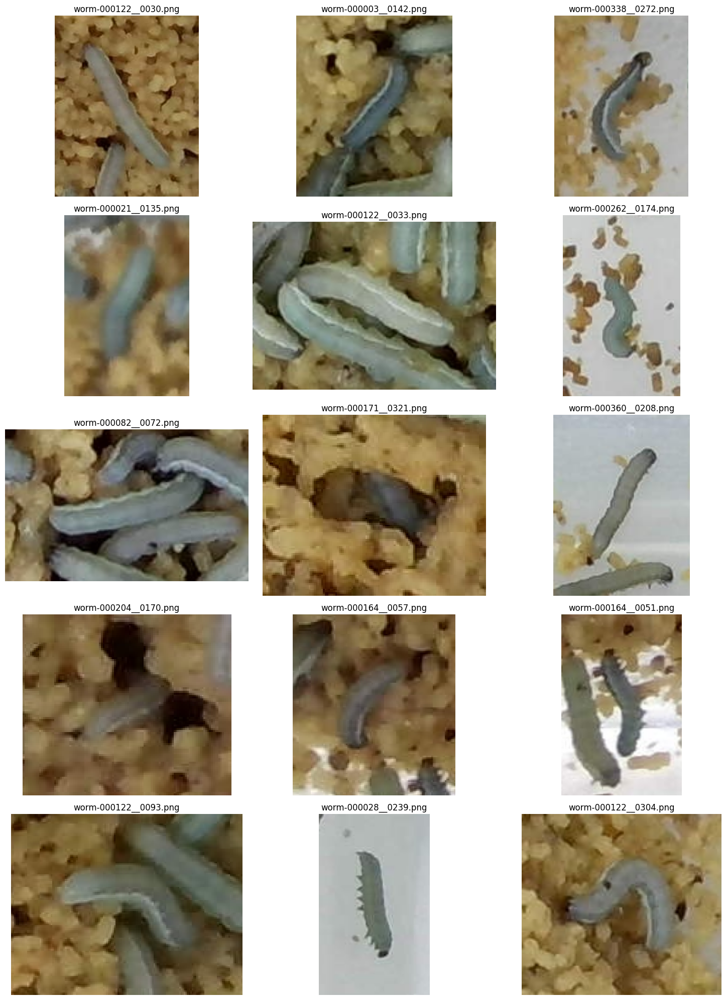

In [21]:
view_image_folder(CLS5_PAD30)

# Visualize model results

=== Validation Accuracy Plots ===


/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


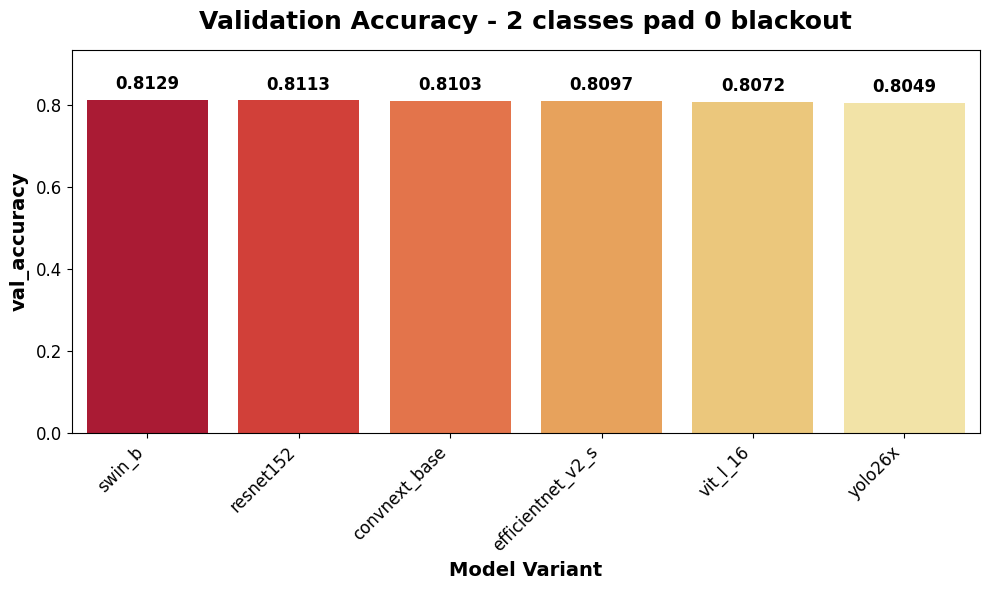

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


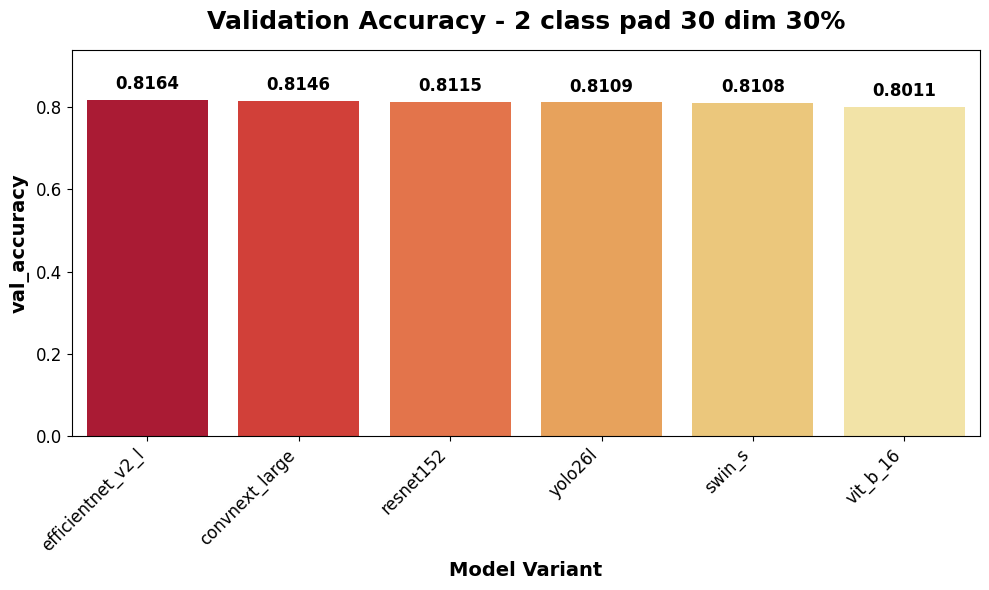

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


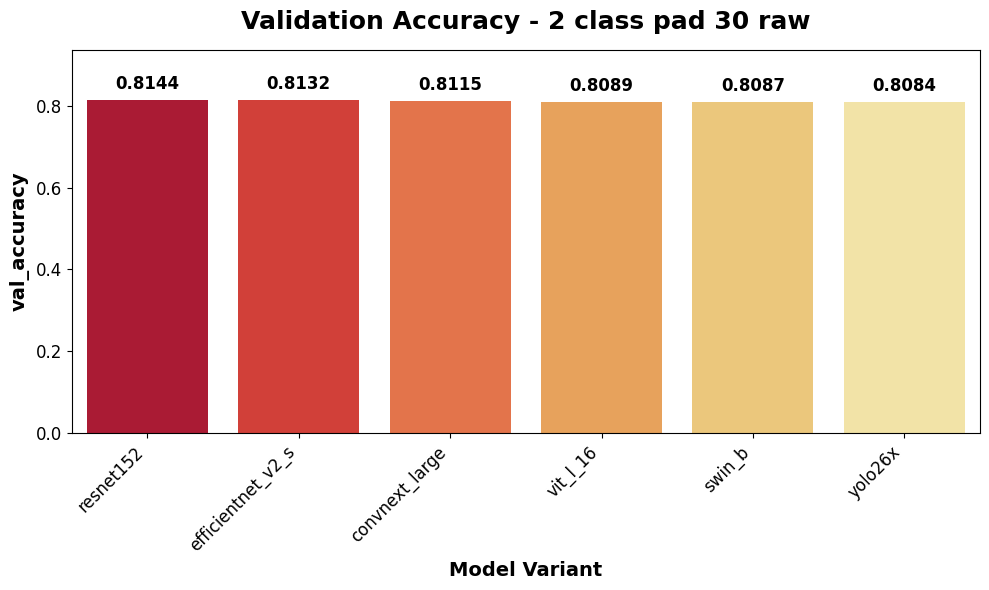

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


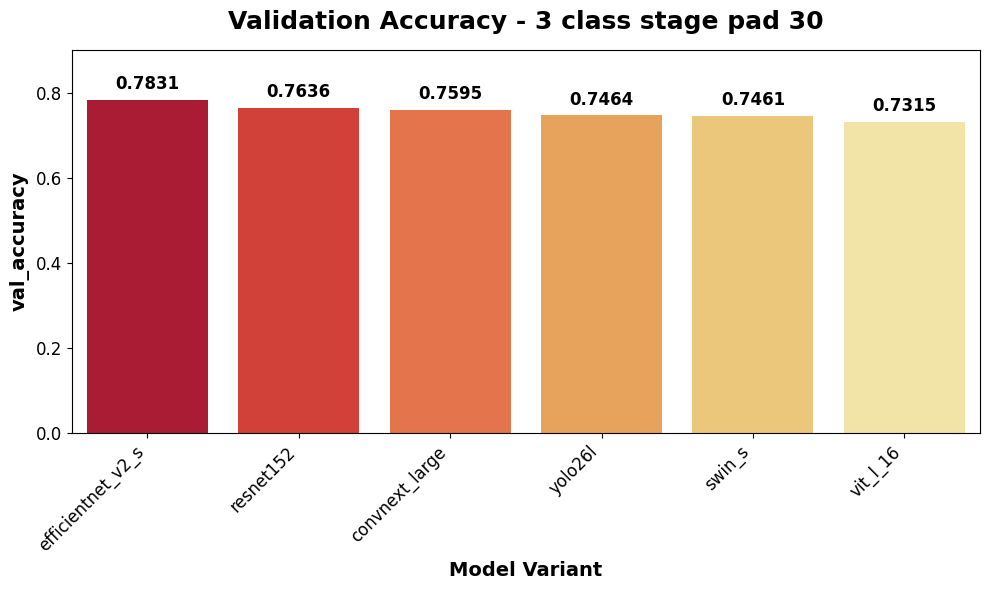

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


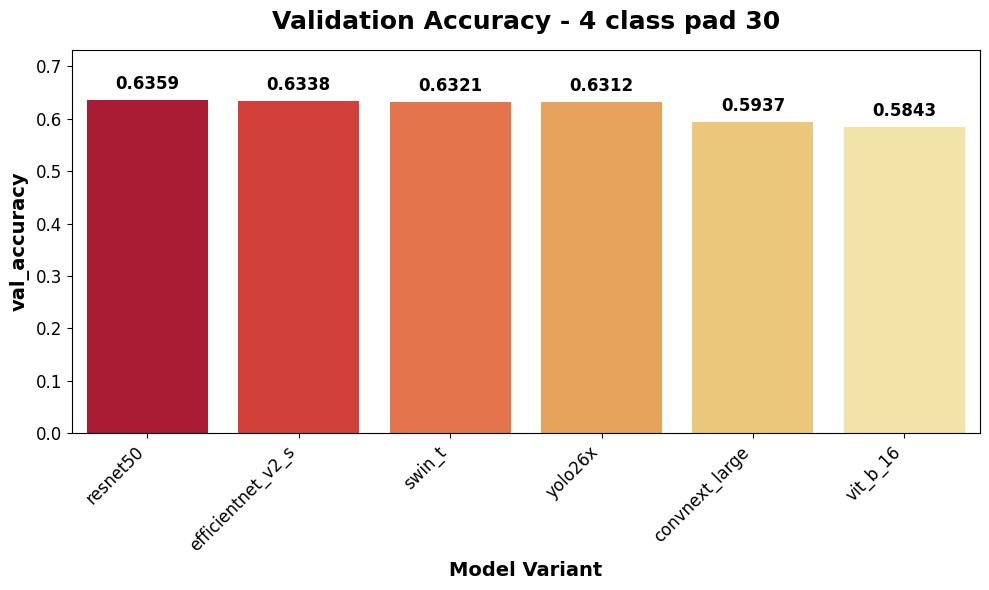

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


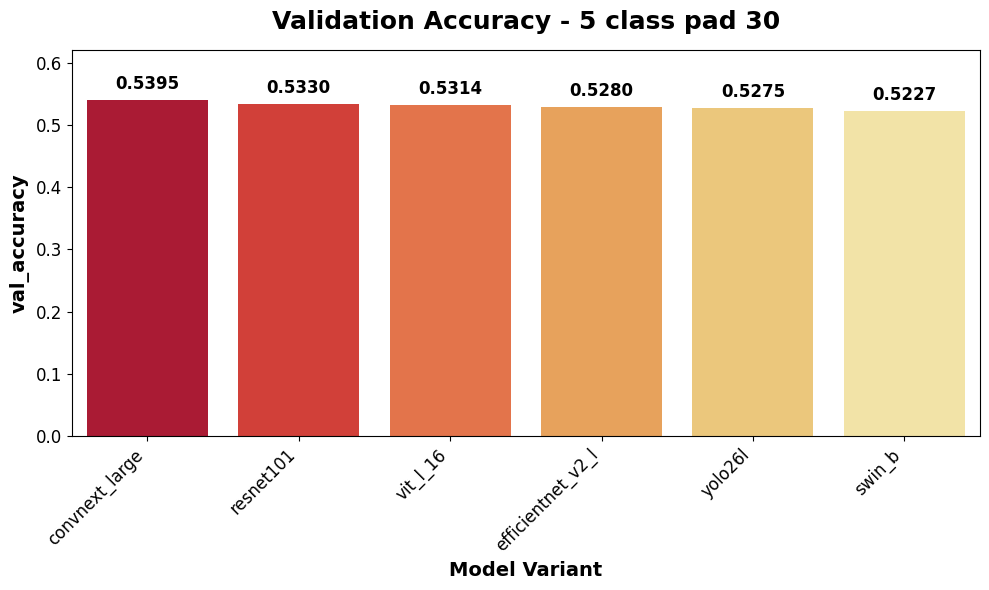

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


=== Validation F1 Score Plots ===


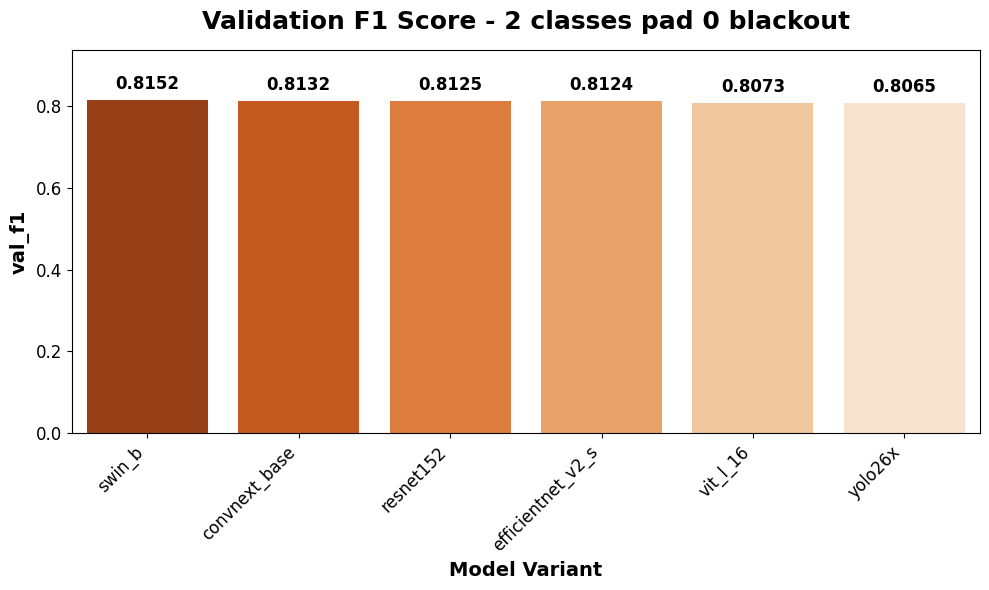

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


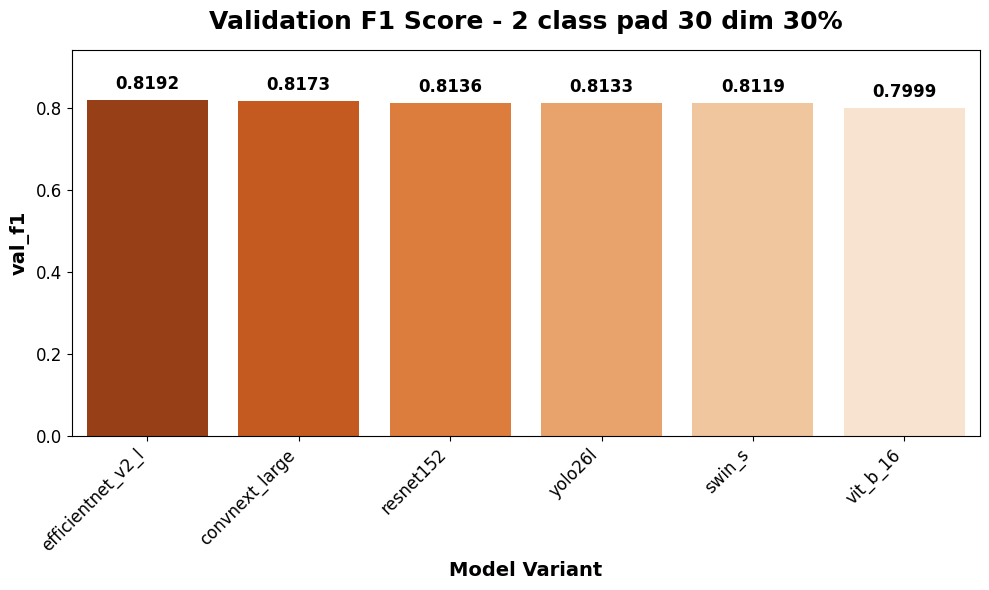

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


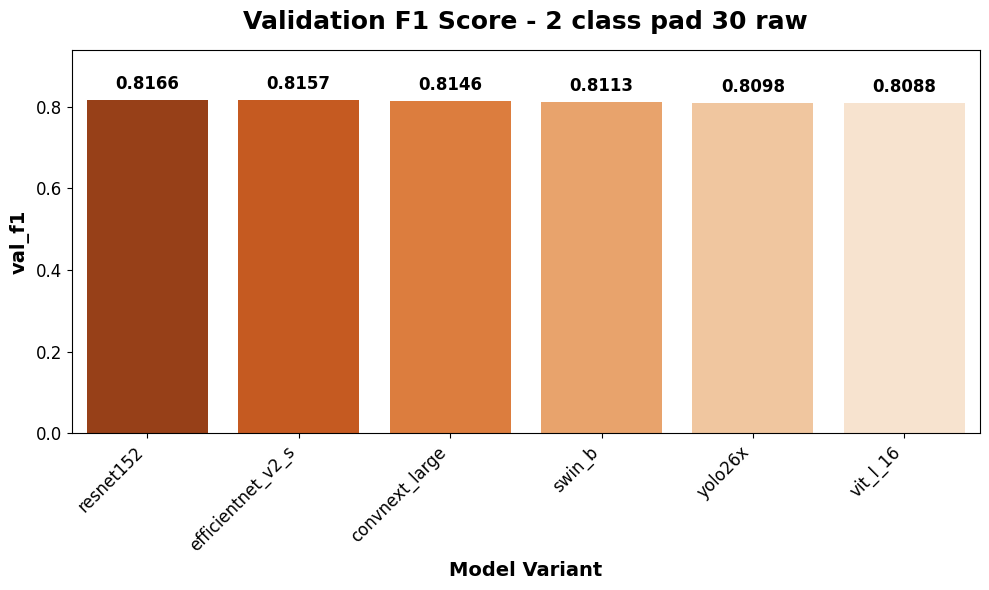

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


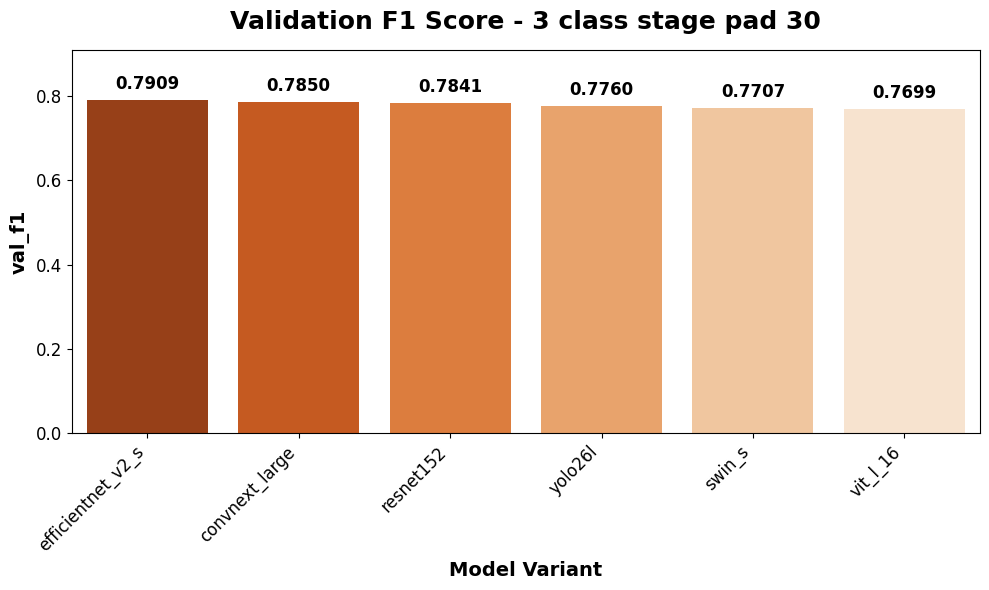

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


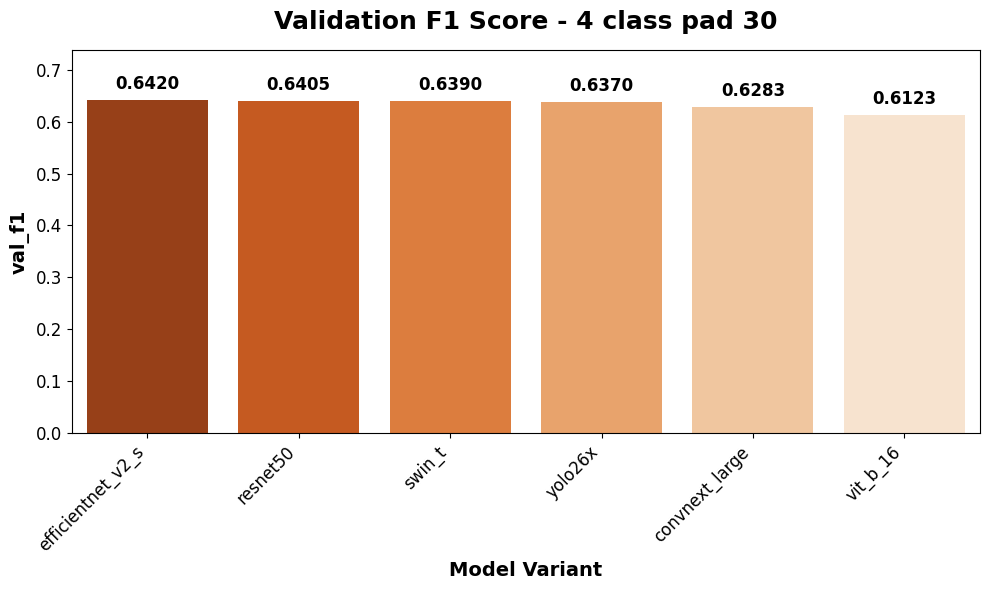

/tmp/ipykernel_481583/3688316270.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)


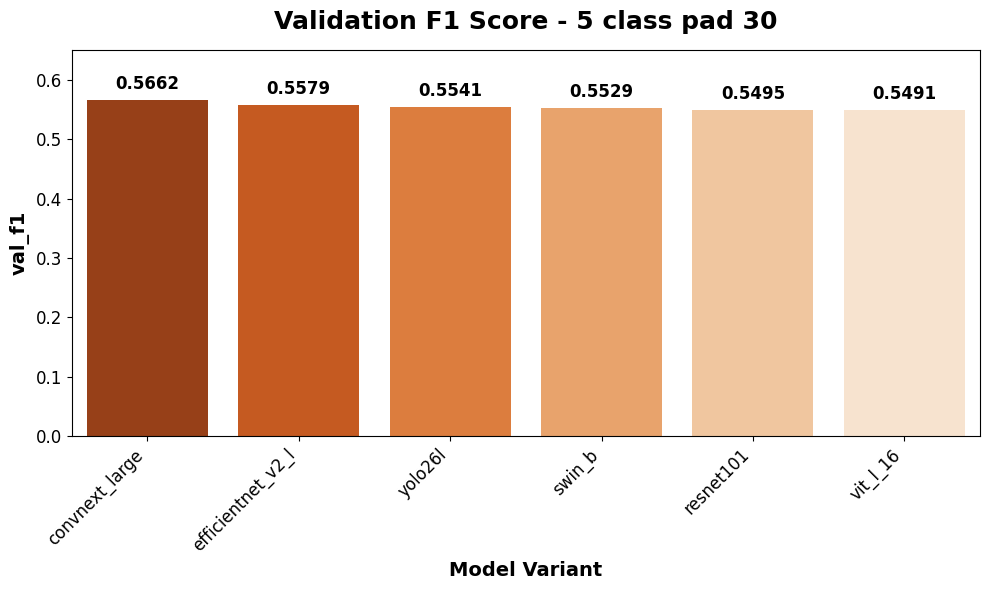

In [23]:
data = [
    # 2 classes pad 0 blackout
    {'Dataset': '2 classes pad 0 blackout', 'Variant': 'convnext_base', 'val_accuracy': 0.8103, 'val_f1': 0.8132},
    {'Dataset': '2 classes pad 0 blackout', 'Variant': 'efficientnet_v2_s', 'val_accuracy': 0.8097, 'val_f1': 0.8124},
    {'Dataset': '2 classes pad 0 blackout', 'Variant': 'resnet152', 'val_accuracy': 0.8113, 'val_f1': 0.8125},
    {'Dataset': '2 classes pad 0 blackout', 'Variant': 'swin_b', 'val_accuracy': 0.8129, 'val_f1': 0.8152},
    {'Dataset': '2 classes pad 0 blackout', 'Variant': 'vit_l_16', 'val_accuracy': 0.8072, 'val_f1': 0.8073},
    {'Dataset': '2 classes pad 0 blackout', 'Variant': 'yolo26x', 'val_accuracy': 0.8049, 'val_f1': 0.8065},

    # 2 class pad 30 dim 30%
    {'Dataset': '2 class pad 30 dim 30%', 'Variant': 'convnext_large', 'val_accuracy': 0.8146, 'val_f1': 0.8173},
    {'Dataset': '2 class pad 30 dim 30%', 'Variant': 'efficientnet_v2_l', 'val_accuracy': 0.8164, 'val_f1': 0.8192},
    {'Dataset': '2 class pad 30 dim 30%', 'Variant': 'resnet152', 'val_accuracy': 0.8115, 'val_f1': 0.8136},
    {'Dataset': '2 class pad 30 dim 30%', 'Variant': 'swin_s', 'val_accuracy': 0.8108, 'val_f1': 0.8119},
    {'Dataset': '2 class pad 30 dim 30%', 'Variant': 'vit_b_16', 'val_accuracy': 0.8011, 'val_f1': 0.7999},
    {'Dataset': '2 class pad 30 dim 30%', 'Variant': 'yolo26l', 'val_accuracy': 0.8109, 'val_f1': 0.8133},

    # 2 class pad 30 raw
    {'Dataset': '2 class pad 30 raw', 'Variant': 'convnext_large', 'val_accuracy': 0.8115, 'val_f1': 0.8146},
    {'Dataset': '2 class pad 30 raw', 'Variant': 'efficientnet_v2_s', 'val_accuracy': 0.8132, 'val_f1': 0.8157},
    {'Dataset': '2 class pad 30 raw', 'Variant': 'resnet152', 'val_accuracy': 0.8144, 'val_f1': 0.8166},
    {'Dataset': '2 class pad 30 raw', 'Variant': 'swin_b', 'val_accuracy': 0.8087, 'val_f1': 0.8113},
    {'Dataset': '2 class pad 30 raw', 'Variant': 'vit_l_16', 'val_accuracy': 0.8089, 'val_f1': 0.8088},
    {'Dataset': '2 class pad 30 raw', 'Variant': 'yolo26x', 'val_accuracy': 0.8084, 'val_f1': 0.8098},

    # 3 class stage pad 30
    {'Dataset': '3 class stage pad 30', 'Variant': 'convnext_large', 'val_accuracy': 0.7595, 'val_f1': 0.7850},
    {'Dataset': '3 class stage pad 30', 'Variant': 'efficientnet_v2_s', 'val_accuracy': 0.7831, 'val_f1': 0.7909},
    {'Dataset': '3 class stage pad 30', 'Variant': 'resnet152', 'val_accuracy': 0.7636, 'val_f1': 0.7841},
    {'Dataset': '3 class stage pad 30', 'Variant': 'swin_s', 'val_accuracy': 0.7461, 'val_f1': 0.7707},
    {'Dataset': '3 class stage pad 30', 'Variant': 'vit_l_16', 'val_accuracy': 0.7315, 'val_f1': 0.7699},
    {'Dataset': '3 class stage pad 30', 'Variant': 'yolo26l', 'val_accuracy': 0.7464, 'val_f1': 0.7760},

    # 4 class pad 30
    {'Dataset': '4 class pad 30', 'Variant': 'convnext_large', 'val_accuracy': 0.5937, 'val_f1': 0.6283},
    {'Dataset': '4 class pad 30', 'Variant': 'efficientnet_v2_s', 'val_accuracy': 0.6338, 'val_f1': 0.6420},
    {'Dataset': '4 class pad 30', 'Variant': 'resnet50', 'val_accuracy': 0.6359, 'val_f1': 0.6405},
    {'Dataset': '4 class pad 30', 'Variant': 'swin_t', 'val_accuracy': 0.6321, 'val_f1': 0.6390},
    {'Dataset': '4 class pad 30', 'Variant': 'vit_b_16', 'val_accuracy': 0.5843, 'val_f1': 0.6123},
    {'Dataset': '4 class pad 30', 'Variant': 'yolo26x', 'val_accuracy': 0.6312, 'val_f1': 0.6370},

    # 5 class pad 30
    {'Dataset': '5 class pad 30', 'Variant': 'convnext_large', 'val_accuracy': 0.5395, 'val_f1': 0.5662},
    {'Dataset': '5 class pad 30', 'Variant': 'efficientnet_v2_l', 'val_accuracy': 0.5280, 'val_f1': 0.5579},
    {'Dataset': '5 class pad 30', 'Variant': 'resnet101', 'val_accuracy': 0.5330, 'val_f1': 0.5495},
    {'Dataset': '5 class pad 30', 'Variant': 'swin_b', 'val_accuracy': 0.5227, 'val_f1': 0.5529},
    {'Dataset': '5 class pad 30', 'Variant': 'vit_l_16', 'val_accuracy': 0.5314, 'val_f1': 0.5491},
    {'Dataset': '5 class pad 30', 'Variant': 'yolo26l', 'val_accuracy': 0.5275, 'val_f1': 0.5541}
]

df = pd.DataFrame(data)

def plot_individual_figures(df, metric, title_prefix, color_palette):
    datasets = df['Dataset'].unique()
    
    for ds in datasets:
        # กรองข้อมูลตาม Dataset และเรียงจากมากไปน้อย
        subset = df[df['Dataset'] == ds].sort_values(by=metric, ascending=False)
        
        # สร้าง Figure 1 รูปต่อ 1 กราฟ ขนาดเหมาะสำหรับลงสไลด์ (16:9 อัตราส่วนโดยประมาณ)
        plt.figure(figsize=(10, 6))
        
        # วาดกราฟแท่งโดยใช้สีที่กำหนด
        ax = sns.barplot(data=subset, x='Variant', y=metric, palette=color_palette)
        
        # เพิ่มค่าตัวเลขบนกราฟ
        for container in ax.containers:
            ax.bar_label(container, fmt='%.4f', padding=5, fontsize=12, weight='bold')

        # ปรับแต่งรายละเอียดต่างๆ เพื่อให้อ่านง่าย
        plt.title(f'{title_prefix} - {ds}', fontsize=18, weight='bold', pad=15)
        plt.xlabel('Model Variant', fontsize=14, weight='bold')
        plt.ylabel(metric, fontsize=14, weight='bold')
        
        # เพิ่มพื้นที่ด้านบนของแกน y เพื่อไม่ให้เลขทับขอบ
        plt.ylim(0, subset[metric].max() * 1.15) 
        
        # ปรับแกน X ให้อ่านง่าย
        plt.xticks(rotation=45, ha='right', fontsize=12)
        plt.yticks(fontsize=12)
        
        plt.tight_layout()
        plt.show() # แสดงผลออกทีละรูป

# วาดกราฟของ val_accuracy (ใช้โทนสีส้ม-แดง-เหลือง ไล่เฉด)
print("=== Validation Accuracy Plots ===")
plot_individual_figures(df, 'val_accuracy', 'Validation Accuracy', 'YlOrRd_r')

# วาดกราฟของ val_f1 (ใช้โทนสีส้มอิฐ ไล่เฉด เพื่อให้แยกความแตกต่างจากอันบนได้นิดหน่อย)
print("=== Validation F1 Score Plots ===")
plot_individual_figures(df, 'val_f1', 'Validation F1 Score', 'Oranges_r')